In [1]:
!pip install torchlars

  Preparing metadata (setup.py) ... done
  Created wheel for torchlars: filename=torchlars-0.1.2-cp310-cp310-linux_x86_64.whl size=170458 sha256=99e2358770423079876675a8f96c60b47da40837d2e8feee4b87449446d6018f
  Stored in directory: /root/.cache/pip/wheels/b4/91/c8/c631927a6e259206b572e7461e6d049b4379d27523c1065e30
Successfully built torchlars


In [3]:
#Imports
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
from torchlars import LARS
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE


In [ ]:
# Device configuration

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyperparameters

batch_size = 128
num_epochs = 50
learning_rate = 1e-3
temperature = 0.1

# Data transforms to be applied to the training images

transform = transforms.Compose([
    transforms.RandomResizedCrop(32, antialias=True),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

# CIFAR10 dataset

train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)


In [ ]:
# SimCLR model architecture: An encoder (ResNet18) and a projector.
class SimCLRModel(nn.Module):
    def __init__(self):
        super(SimCLRModel, self).__init__()
        self.encoder = torchvision.models.resnet18(pretrained=False)
        self.encoder.fc = nn.Identity()
        self.projector = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Linear(128, 128)
        )

    def forward(self, x):
        z = self.encoder(x)
        p = self.projector(z)
        return z, F.normalize(p, dim=1)

model = SimCLRModel().to(device)

In [ ]:
#SimCLR used  LARS optimizer as it's better for large batch sizes ( original implementation used 4096) but, here we just used 128.
base_optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-6)
optimizer = LARS(optimizer=base_optimizer, eps=1e-8, trust_coef=0.001)


In [ ]:
# Loss function of calculating the contrastive loss
def nt_xent_loss(p1, p2, temperature):
    batch_size = p1.shape[0]
    labels = torch.cat([torch.arange(batch_size) for _ in range(2)], dim=0)
    labels = (labels.unsqueeze(0) == labels.unsqueeze(1)).float().to(device)

    features = torch.cat([p1, p2], dim=0)
    similarity_matrix = F.cosine_similarity(features.unsqueeze(1), features.unsqueeze(0), dim=2)

    mask = torch.eye(labels.shape[0], dtype=torch.bool).to(device)
    labels = labels[~mask].view(labels.shape[0], -1)
    similarity_matrix = similarity_matrix[~mask].view(similarity_matrix.shape[0], -1)

    positives = similarity_matrix[labels.bool()].view(labels.shape[0], -1)
    negatives = similarity_matrix[~labels.bool()].view(labels.shape[0], -1)

    logits = torch.cat([positives, negatives], dim=1)
    labels = torch.zeros(logits.shape[0], dtype=torch.long).to(device)

    logits = logits / temperature
    return F.cross_entropy(logits, labels)


In [ ]:
# Visualization with t-SNE
def visualize_tsne(embeddings, labels):
    tsne = TSNE(n_components=2, random_state=42)
    embeddings_tsne = tsne.fit_transform(embeddings)

    plt.figure(figsize=(10, 8))
    for i in range(10):  # Assuming there are 10 classes in CIFAR-10
        indices = labels == i
        plt.scatter(embeddings_tsne[indices, 0], embeddings_tsne[indices, 1], label=f'Class {i}', alpha=0.5)
    plt.title('t-SNE Visualization of Embeddings')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.legend()
    plt.show()

Files already downloaded and verified


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.77it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multi

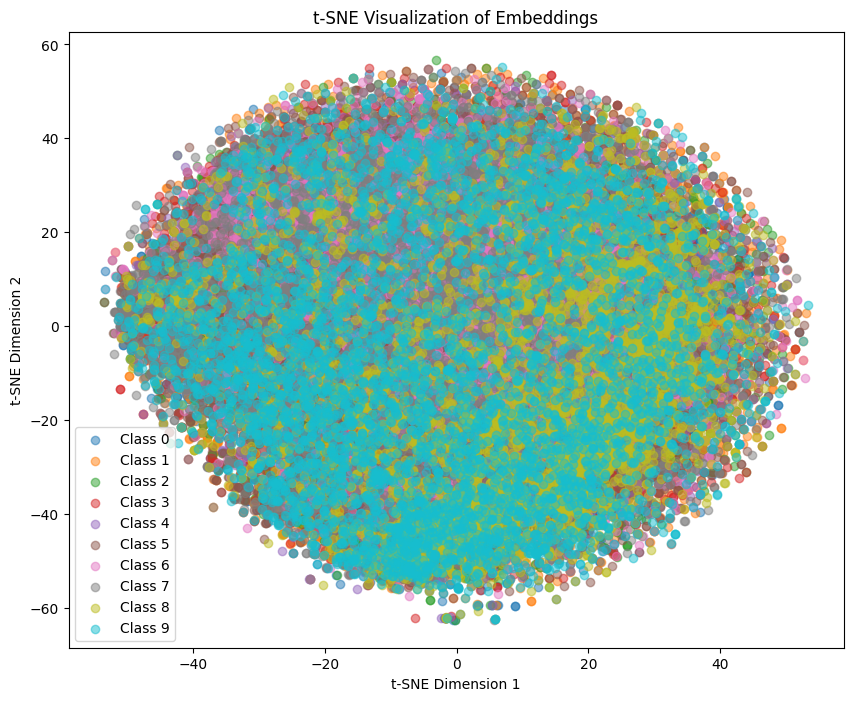

Epoch [1/100], Loss: 0.3039


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.74it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [2/100], Loss: 0.0296


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [3/100], Loss: 0.0256


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [4/100], Loss: 0.0241


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [5/100], Loss: 0.0233


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [6/100], Loss: 0.0226


100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


Epoch [7/100], Loss: 0.0220


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [8/100], Loss: 0.0217


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [9/100], Loss: 0.0213


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [10/100], Loss: 0.0210


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


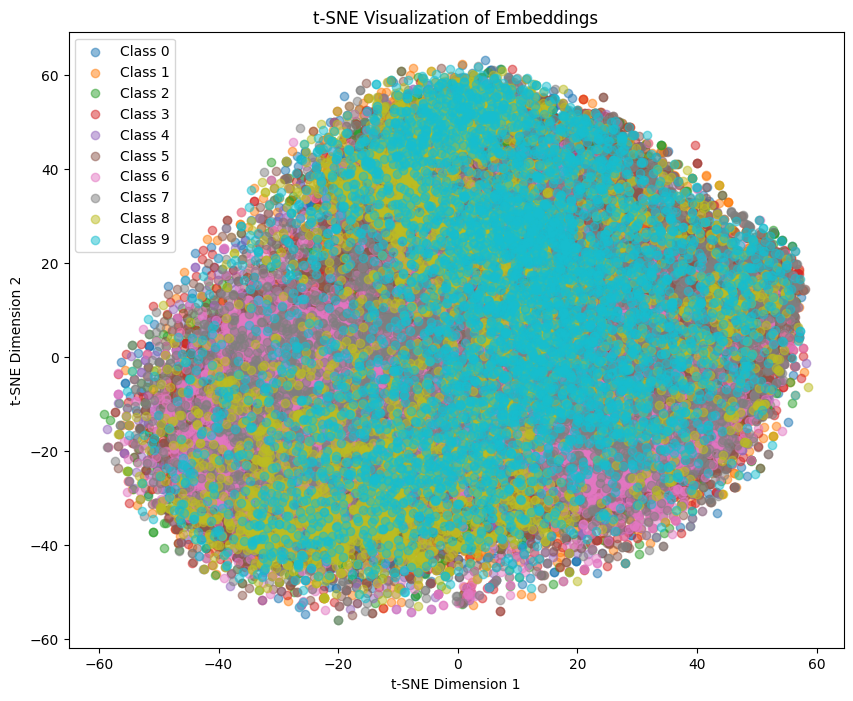

Epoch [11/100], Loss: 0.0208


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.70it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.58it/s]


Epoch [12/100], Loss: 0.0206


100%|██████████| 391/391 [00:51<00:00,  7.58it/s]


Epoch [13/100], Loss: 0.0204


100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


Epoch [14/100], Loss: 0.0202


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [15/100], Loss: 0.0200


100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


Epoch [16/100], Loss: 0.0199


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


Epoch [17/100], Loss: 0.0198


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


Epoch [18/100], Loss: 0.0196


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


Epoch [19/100], Loss: 0.0195


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [20/100], Loss: 0.0194


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


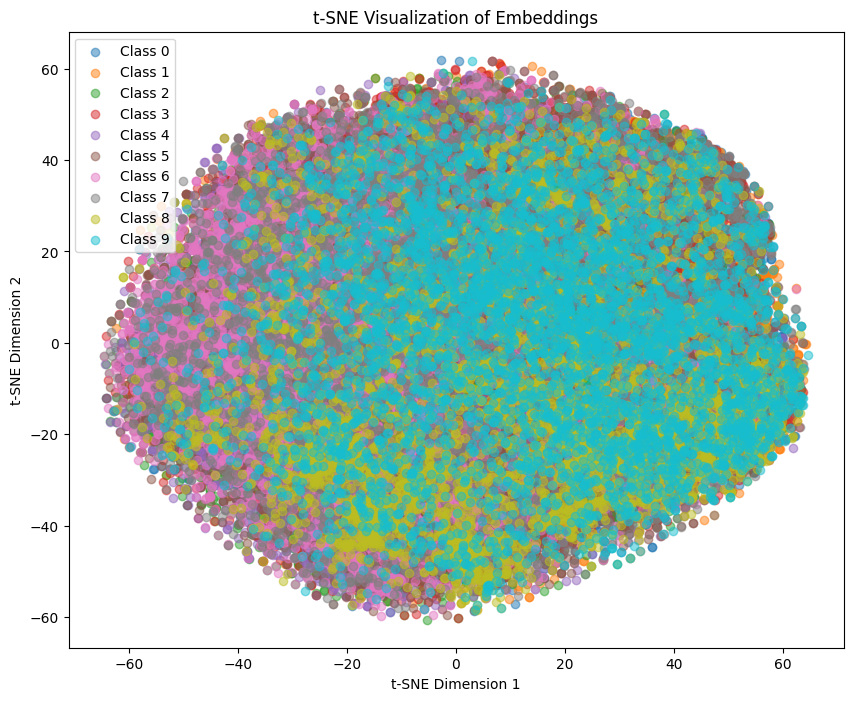

Epoch [21/100], Loss: 0.0193


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.76it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [22/100], Loss: 0.0192


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [23/100], Loss: 0.0191


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [24/100], Loss: 0.0190


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [25/100], Loss: 0.0189


100%|██████████| 391/391 [00:50<00:00,  7.67it/s]


Epoch [26/100], Loss: 0.0188


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [27/100], Loss: 0.0188


100%|██████████| 391/391 [00:50<00:00,  7.67it/s]


Epoch [28/100], Loss: 0.0187


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [29/100], Loss: 0.0187


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [30/100], Loss: 0.0186


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


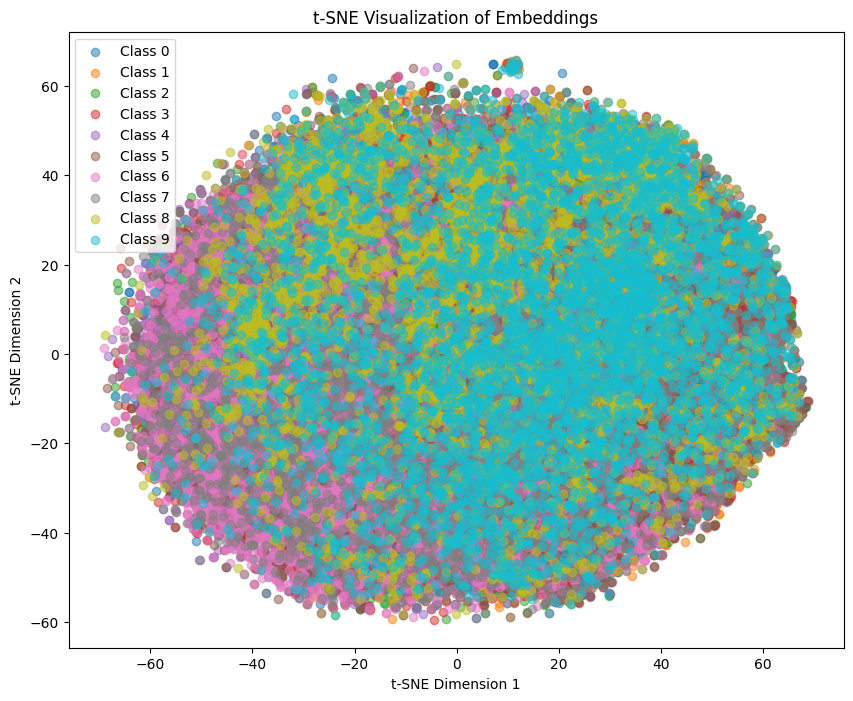

Epoch [31/100], Loss: 0.0185


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.78it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [32/100], Loss: 0.0185


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [33/100], Loss: 0.0184


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [34/100], Loss: 0.0184


100%|██████████| 391/391 [00:50<00:00,  7.67it/s]


Epoch [35/100], Loss: 0.0183


100%|██████████| 391/391 [00:50<00:00,  7.67it/s]


Epoch [36/100], Loss: 0.0183


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [37/100], Loss: 0.0182


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [38/100], Loss: 0.0182


100%|██████████| 391/391 [00:50<00:00,  7.67it/s]


Epoch [39/100], Loss: 0.0181


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [40/100], Loss: 0.0181


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


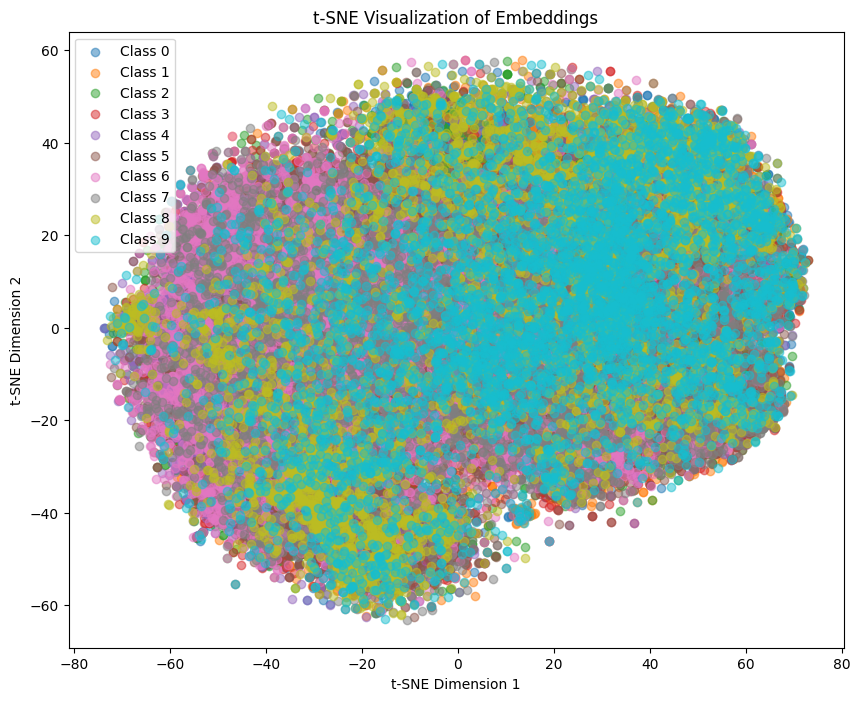

Epoch [41/100], Loss: 0.0180


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.78it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


Epoch [42/100], Loss: 0.0180


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


Epoch [43/100], Loss: 0.0180


100%|██████████| 391/391 [00:51<00:00,  7.58it/s]


Epoch [44/100], Loss: 0.0180


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


Epoch [45/100], Loss: 0.0179


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


Epoch [46/100], Loss: 0.0179


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


Epoch [47/100], Loss: 0.0178


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [48/100], Loss: 0.0178


100%|██████████| 391/391 [00:51<00:00,  7.67it/s]


Epoch [49/100], Loss: 0.0178


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [50/100], Loss: 0.0178


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


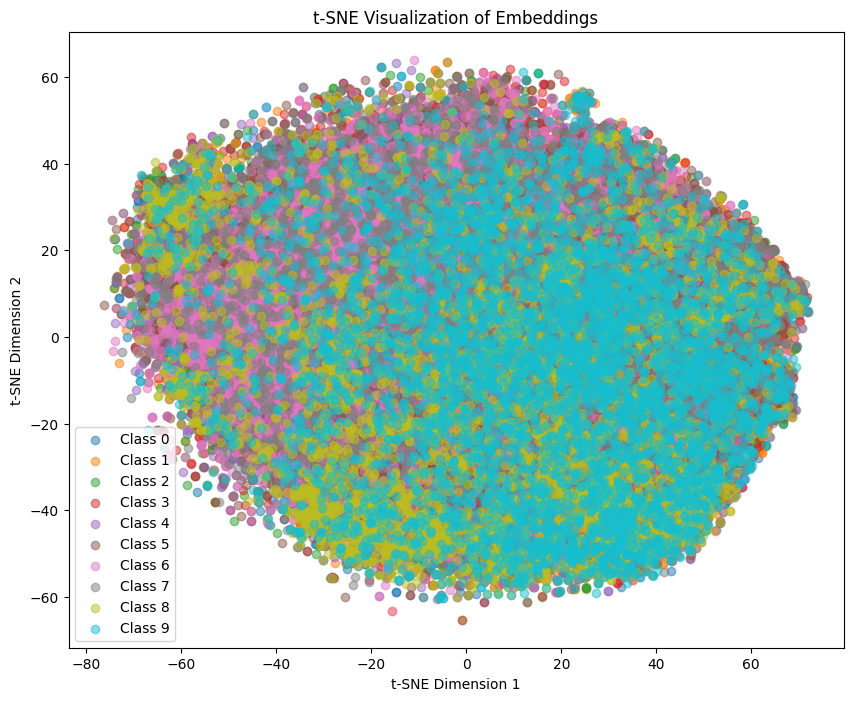

Epoch [51/100], Loss: 0.0177


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.75it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [52/100], Loss: 0.0177


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [53/100], Loss: 0.0177


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [54/100], Loss: 0.0177


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [55/100], Loss: 0.0176


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [56/100], Loss: 0.0176


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [57/100], Loss: 0.0176


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [58/100], Loss: 0.0175


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [59/100], Loss: 0.0176


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


Epoch [60/100], Loss: 0.0175


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


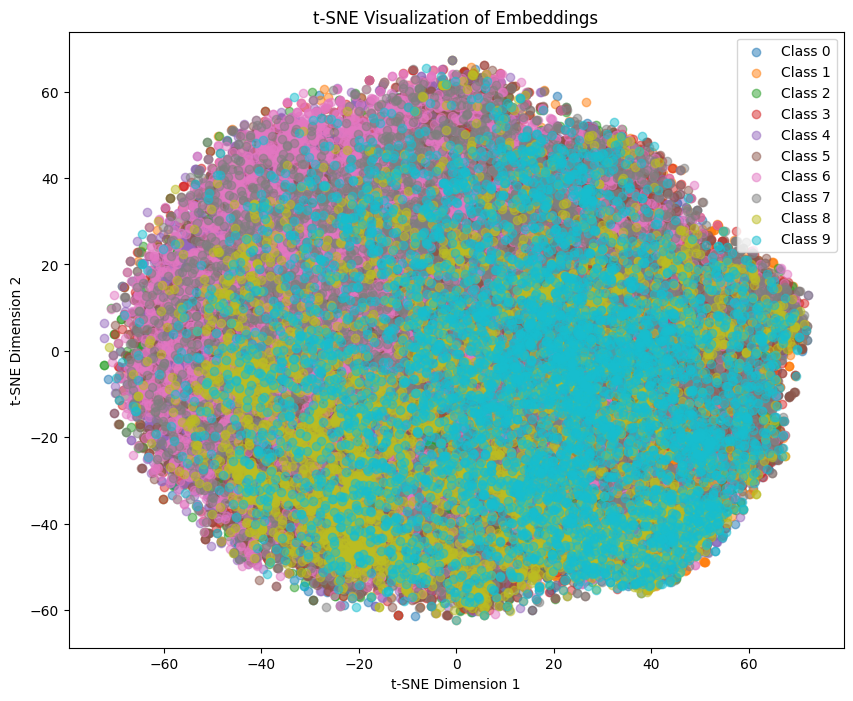

Epoch [61/100], Loss: 0.0175


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.75it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [62/100], Loss: 0.0175


100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


Epoch [63/100], Loss: 0.0175


100%|██████████| 391/391 [00:50<00:00,  7.67it/s]


Epoch [64/100], Loss: 0.0175


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [65/100], Loss: 0.0174


100%|██████████| 391/391 [00:50<00:00,  7.67it/s]


Epoch [66/100], Loss: 0.0174


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [67/100], Loss: 0.0174


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [68/100], Loss: 0.0174


100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


Epoch [69/100], Loss: 0.0174


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [70/100], Loss: 0.0173


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


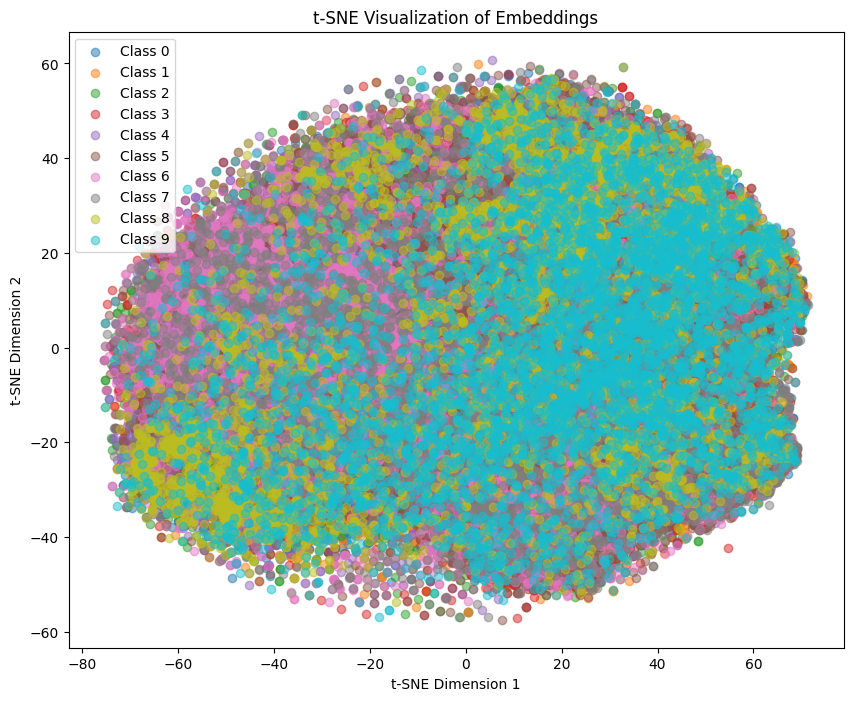

Epoch [71/100], Loss: 0.0173


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.72it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


Epoch [72/100], Loss: 0.0173


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [73/100], Loss: 0.0173


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [74/100], Loss: 0.0173


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [75/100], Loss: 0.0172


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [76/100], Loss: 0.0172


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [77/100], Loss: 0.0172


100%|██████████| 391/391 [00:50<00:00,  7.67it/s]


Epoch [78/100], Loss: 0.0172


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [79/100], Loss: 0.0172


100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [80/100], Loss: 0.0172


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


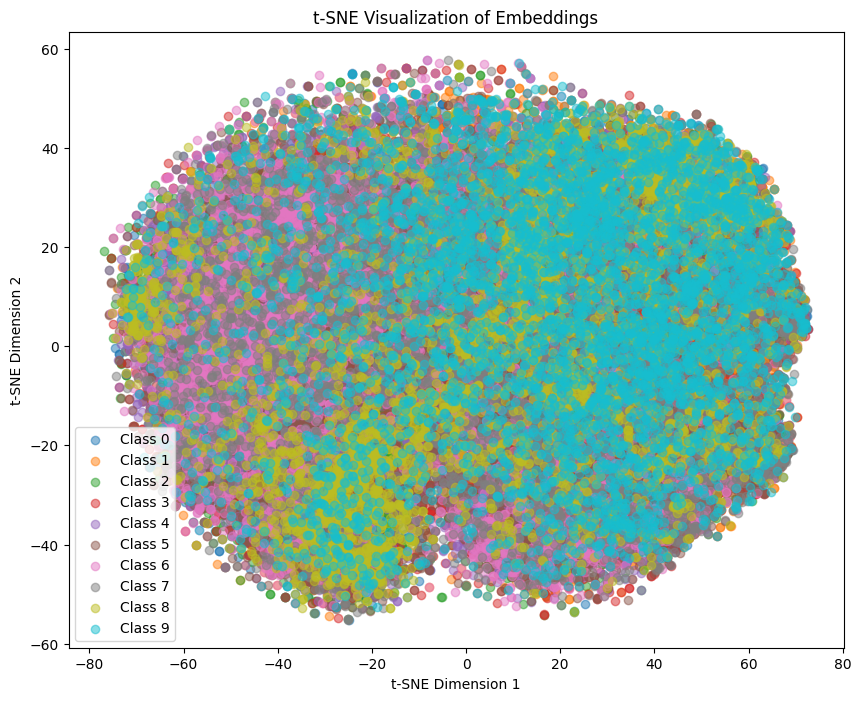

Epoch [81/100], Loss: 0.0172


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.78it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [82/100], Loss: 0.0172


100%|██████████| 391/391 [00:51<00:00,  7.64it/s]


Epoch [83/100], Loss: 0.0172


100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


Epoch [84/100], Loss: 0.0171


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


Epoch [85/100], Loss: 0.0171


100%|██████████| 391/391 [00:51<00:00,  7.57it/s]


Epoch [86/100], Loss: 0.0171


100%|██████████| 391/391 [00:51<00:00,  7.59it/s]


Epoch [87/100], Loss: 0.0171


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [88/100], Loss: 0.0171


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [89/100], Loss: 0.0171


100%|██████████| 391/391 [00:51<00:00,  7.59it/s]


Epoch [90/100], Loss: 0.0171


100%|██████████| 391/391 [00:51<00:00,  7.58it/s]


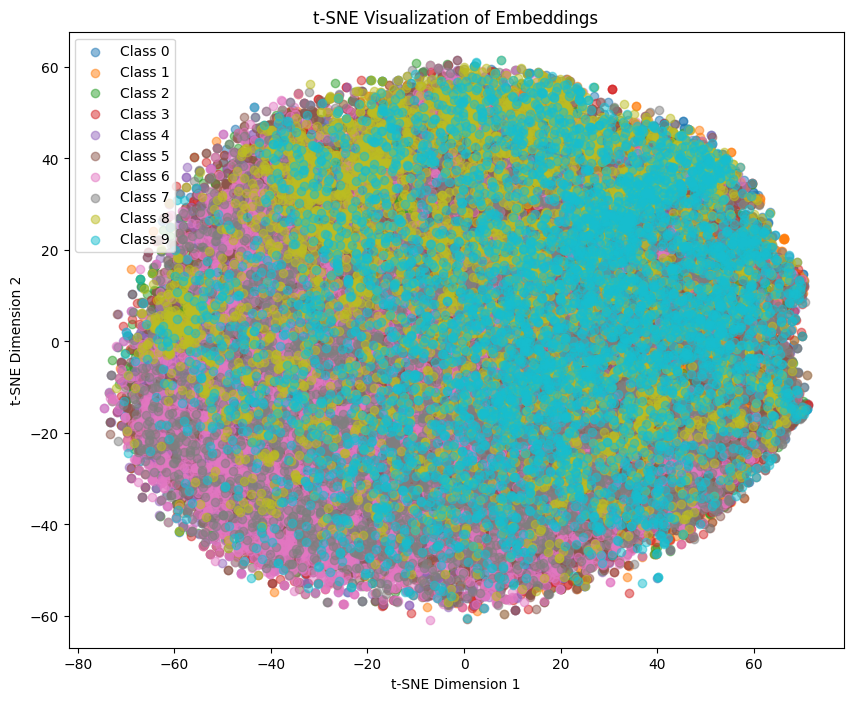

Epoch [91/100], Loss: 0.0171


  0%|          | 0/391 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 390/391 [00:51<00:00,  7.78it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 391/391 [00:51<00:00,  7.65it/s]


Epoch [92/100], Loss: 0.0170


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [93/100], Loss: 0.0170


100%|██████████| 391/391 [00:51<00:00,  7.67it/s]


Epoch [94/100], Loss: 0.0170


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


Epoch [95/100], Loss: 0.0170


100%|██████████| 391/391 [00:51<00:00,  7.54it/s]


Epoch [96/100], Loss: 0.0170


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


Epoch [97/100], Loss: 0.0170


100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


Epoch [98/100], Loss: 0.0170


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


Epoch [99/100], Loss: 0.0170


100%|██████████| 391/391 [00:51<00:00,  7.66it/s]


In [ ]:
# Training loop
for epoch in range(num_epochs):

    total_loss = 0
    all_embeddings = []
    all_labels = []
    all_images = [] 
    
    for images, labels in tqdm(train_loader):
        # Get two augmented views of the same image
        img1, img2 = images.to(device), images.to(device)

        z1, p1 = model(img1)
        z2, p2 = model(img2)

        loss = nt_xent_loss(p1, p2, temperature)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        all_embeddings.append(z1.cpu().detach().numpy())
        all_labels.append(labels.cpu().detach().numpy())

    # Concatenate all embeddings and  labels to make access to specific indices easier ( for visualization)
    embeddings = np.concatenate(all_embeddings, axis=0)
    labels = np.concatenate(all_labels, axis=0)

    writer.add_scalar('Loss', total_loss / len(train_loader), epoch)

    # Visualize embeddings with t-SNE
    if epoch % 10 == 0 or epoch == num_epochs - 1:
        visualize_tsne(embeddings, labels)


    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / len(train_loader):.4f}')

writer.close()
